Unzip the **File**

In [ ]:
import zipfile
import os

# Path to the zip file
zip_path = '/content/dataset.zip'
output_dir = '/content/dataset/'

# Unzip the file
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(output_dir)

print(f"Files extracted to {output_dir}")


Files extracted to /content/dataset/


List the Subfolders (Image Categories)

In [ ]:
import os

# Path to the dataset containing subfolders
dataset_dir = '/content/dataset/dataset/'

# List all subfolders (categories)
categories = [folder for folder in os.listdir(dataset_dir) if os.path.isdir(os.path.join(dataset_dir, folder))]
print(f"Found {len(categories)} categories: {categories}")


Found 47 categories: ['fibrous', 'dotted', 'potholed', 'crystalline', 'chequered', 'zigzagged', 'cobwebbed', 'banded', 'woven', 'grooved', 'crosshatched', 'lined', 'studded', 'honeycombed', 'spiralled', 'scaly', 'pitted', 'cracked', 'grid', 'knitted', 'polka-dotted', 'stained', 'lacelike', 'wrinkled', 'matted', 'bubbly', 'sprinkled', 'paisley', 'porous', 'waffled', 'perforated', 'pleated', 'marbled', 'freckled', 'veined', 'flecked', 'smeared', 'meshed', 'braided', 'swirly', 'interlaced', 'gauzy', 'stratified', 'striped', 'blotchy', 'bumpy', 'frilly']


Count the Number of Images in Each Category

In [ ]:
# Count the number of images in each category
for category in categories:
    category_path = os.path.join(dataset_dir, category)
    num_images = len([img for img in os.listdir(category_path) if img.endswith('.jpg')])
    print(f"Category '{category}' contains {num_images} images.")


Category 'fibrous' contains 120 images.
Category 'dotted' contains 120 images.
Category 'potholed' contains 120 images.
Category 'crystalline' contains 120 images.
Category 'chequered' contains 120 images.
Category 'zigzagged' contains 120 images.
Category 'cobwebbed' contains 120 images.
Category 'banded' contains 120 images.
Category 'woven' contains 120 images.
Category 'grooved' contains 120 images.
Category 'crosshatched' contains 120 images.
Category 'lined' contains 120 images.
Category 'studded' contains 120 images.
Category 'honeycombed' contains 120 images.
Category 'spiralled' contains 120 images.
Category 'scaly' contains 120 images.
Category 'pitted' contains 120 images.
Category 'cracked' contains 120 images.
Category 'grid' contains 120 images.
Category 'knitted' contains 120 images.
Category 'polka-dotted' contains 120 images.
Category 'stained' contains 120 images.
Category 'lacelike' contains 120 images.
Category 'wrinkled' contains 120 images.
Category 'matted' conta

Load and Display an Example Image from Each Category

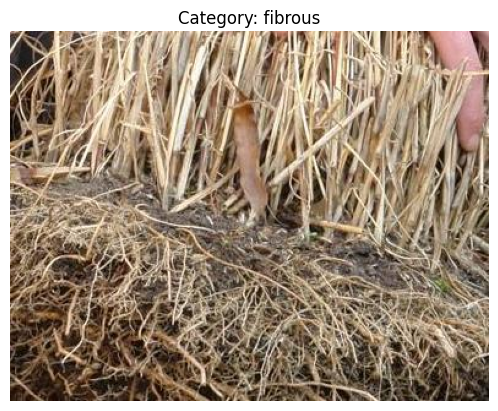

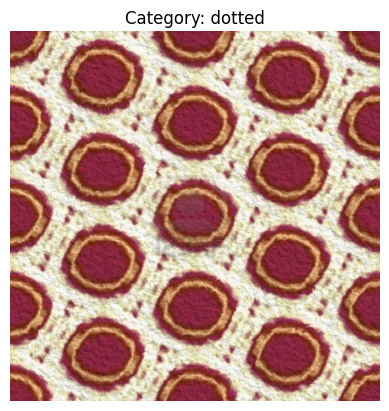

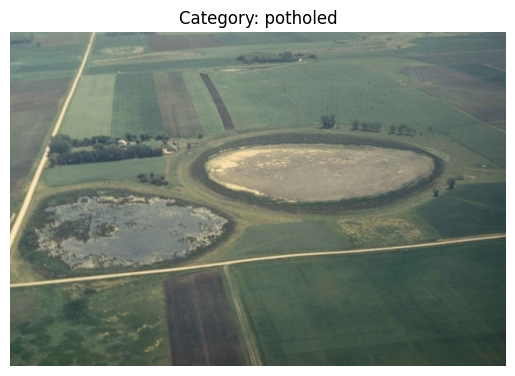

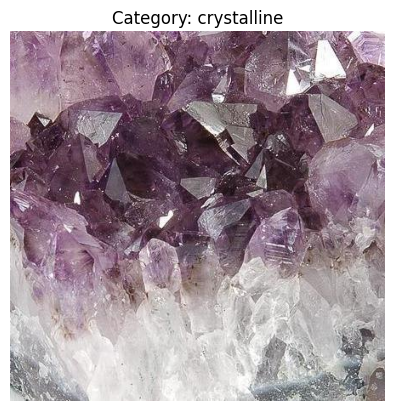

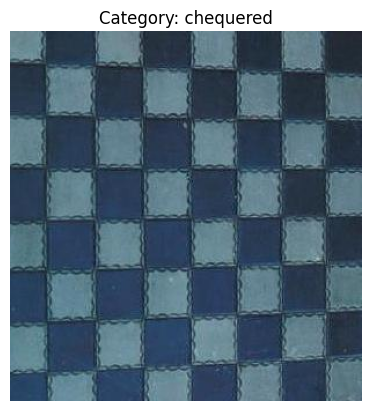

...

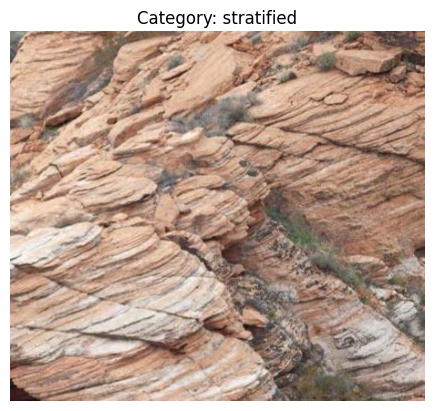

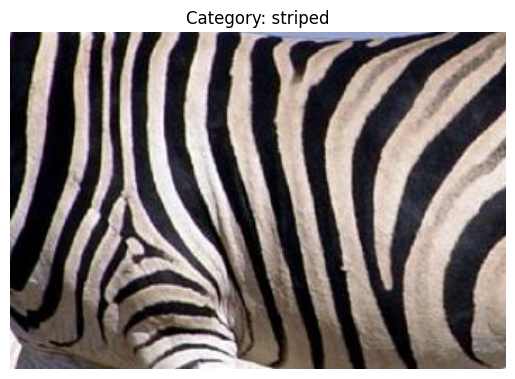

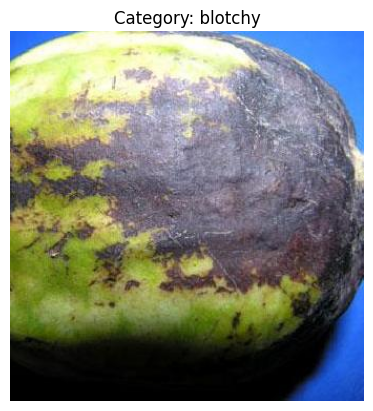

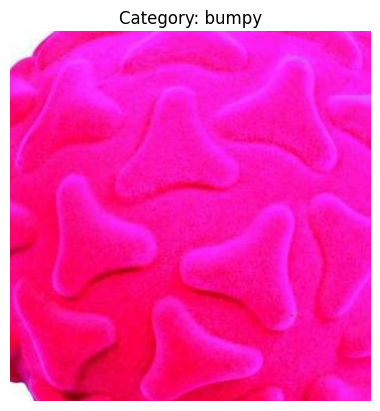

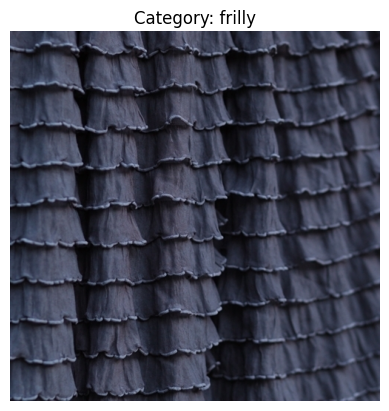

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt

# Load and display one image from each category
for category in categories:
    category_path = os.path.join(dataset_dir, category)
    image_path = os.path.join(category_path, os.listdir(category_path)[0])

    # Load the image
    img = Image.open(image_path)

    # Display the image
    plt.imshow(img)
    plt.title(f"Category: {category}")
    plt.axis('off')
    plt.show()


In [ ]:
from PIL import Image
import os

# Path to the dataset containing subfolders (categories)
dataset_dir = '/content/dataset/dataset/'

# Define the target size for resizing
target_size = (256, 256)  # Make sure this is defined

# Create a new directory for resized images
resized_dir = '/content/dataset/resized_dataset/'
if not os.path.exists(resized_dir):
    os.makedirs(resized_dir)

# Loop through the categories and save the resized images in a new folder
for category in os.listdir(dataset_dir):
    category_path = os.path.join(dataset_dir, category)

    if os.path.isdir(category_path):
        new_category_path = os.path.join(resized_dir, category)
        os.makedirs(new_category_path, exist_ok=True)

        # Loop over each image in the category
        for img_name in os.listdir(category_path):
            if img_name.endswith('.jpg'):
                img_path = os.path.join(category_path, img_name)

                # Open and resize the image
                img = Image.open(img_path)
                img_resized = img.resize(target_size)

                # Save the resized image to the new directory
                img_resized.save(os.path.join(new_category_path, img_name))

print("All images have been resized and saved to the new directory.")


All images have been resized and saved to the new directory.


In [7]:
import numpy as np
from PIL import Image
import os
from scipy.signal import convolve2d

# Define original Law's masks
def laws_mask(mask_type):
    if mask_type == 'L5':
        return np.array([[1,  4,  6,  4, 1],
                         [4, 16, 24, 16, 4],
                         [6, 24, 36, 24, 6],
                         [4, 16, 24, 16, 4],
                         [1,  4,  6,  4, 1]])  # Level mask
    elif mask_type == 'E5':
        return np.array([[1, -4,  0,  4, -1],
                         [0,  0,  0,  0,  0],
                         [0,  0,  0,  0,  0],
                         [0,  0,  0,  0,  0],
                         [0,  0,  0,  0,  0]])  # Edge mask
    elif mask_type == 'S5':
        return np.array([[1, -2,  0,  2, -1],
                         [0,  0,  0,  0,  0],
                         [0,  0,  0,  0,  0],
                         [0,  0,  0,  0,  0],
                         [0,  0,  0,  0,  0]])  # Spot mask
    elif mask_type == 'R5':
        return np.array([[1, -4, 6, -4, 1],
                         [0,  0, 0,  0, 0],
                         [0,  0, 0,  0, 0],
                         [0,  0, 0,  0, 0],
                         [0,  0, 0,  0, 0]])  # Ripple mask
    elif mask_type == 'W5':
        return np.array([[1,  2,  0, -2, -1],
                         [0,  0,  0,  0, 0],
                         [0,  0,  0,  0, 0],
                         [0,  0,  0,  0, 0],
                         [0,  0,  0,  0, 0]])  # Wave mask
    return None

# Function to extract features from a single image
def extract_features(image_path):
    # Load the image
    img = Image.open(image_path).convert('L')  # Convert to grayscale
    img = img.resize((256, 256))  # Resize if necessary

    # Convert image to numpy array
    img_array = np.array(img)

    # Initialize the feature matrix (64x25)
    feature_matrix = np.zeros((64, 25))

    # Split the image into 64 parts (32x32)
    part_size = 32
    index = 0
    for i in range(0, img_array.shape[0], part_size):
        for j in range(0, img_array.shape[1], part_size):
            if index < 64:  # Ensure we only get 64 parts
                sub_image = img_array[i:i + part_size, j:j + part_size]

                # Apply Law's masks to the sub-image
                features = apply_laws_masks(sub_image)

                # Store the features in the feature matrix
                feature_matrix[index] = features
                index += 1

    return feature_matrix

# Function to apply Law's masks and extract features
def apply_laws_masks(sub_image):
    # Define the masks you want to apply
    masks = ['L5', 'E5', 'S5', 'R5', 'W5']  # List of masks
    features = []

    for mask_type in masks:
        mask = laws_mask(mask_type)
        # Apply the mask to the sub-image (convolve)
        filtered_image = convolve2d(sub_image, mask, mode='valid')

        # Extract multiple features from the filtered image
        features.append(np.mean(filtered_image))          # Mean
        features.append(np.var(filtered_image))           # Variance
        features.append(np.max(filtered_image))           # Max value
        features.append(np.min(filtered_image))           # Min value
        features.append(np.sum(filtered_image))           # Sum

    return np.array(features)

# Function to process all images in the directory structure
def process_images_in_directory(root_dir):
    feature_matrices = []
    for category in os.listdir(root_dir):
        category_path = os.path.join(root_dir, category)

        if os.path.isdir(category_path):  # Check if it's a directory
            for img_name in os.listdir(category_path):
                if img_name.endswith('.jpg'):
                    img_path = os.path.join(category_path, img_name)
                    features = extract_features(img_path)  # Extract features
                    feature_matrices.append((img_name, features))  # Store the image name and its feature matrix

    return feature_matrices

# Example usage
root_dir = '/content/dataset/resized_dataset/'  # Path to the root directory
all_feature_matrices = process_images_in_directory(root_dir)

# Output the feature matrices for each image
for img_name, features in all_feature_matrices:
    print(f"Image: {img_name}, Feature Matrix (64x25):")
    print(features)


Streaming output truncated to the last 5000 lines.
  -7.20000000e+01 -2.58000000e+03]]
Image: bumpy_0070.jpg, Feature Matrix (64x25):
[[ 2.27982857e+04  2.98600087e+07  3.37780000e+04 ...  2.57000000e+02
  -1.89000000e+02 -4.89000000e+02]
 [ 2.37848176e+04  3.58578341e+07  3.39160000e+04 ...  3.44000000e+02
  -1.84000000e+02  7.17000000e+02]
 [ 2.42755510e+04  3.20245164e+07  3.26710000e+04 ...  3.45000000e+02
  -1.76000000e+02  1.82700000e+03]
 ...
 [ 2.94884043e+04  4.55256253e+07  4.65010000e+04 ...  3.95000000e+02
  -3.69000000e+02 -8.09000000e+02]
 [ 1.45542755e+04  1.21145917e+08  3.65460000e+04 ...  3.84000000e+02
  -2.69000000e+02  4.24800000e+03]
 [ 2.60253418e+04  3.55185909e+07  3.75670000e+04 ...  1.41000000e+02
  -1.84000000e+02 -4.56700000e+03]]
Image: bumpy_0197.jpg, Feature Matrix (64x25):
[[ 4.23090702e+04  1.40486909e+08  5.54600000e+04 ...  2.69000000e+02
  -2.77000000e+02 -1.19840000e+04]
 [ 4.74759732e+04  1.16113763e+08  5.75490000e+04 ...  3.58000000e+02
  -2.960

In [8]:
import numpy as np
from PIL import Image
import os
from scipy.signal import convolve2d

# Define original Law's masks
def laws_mask(mask_type):
    if mask_type == 'L5':
        return np.array([[1,  4,  6,  4, 1],
                         [4, 16, 24, 16, 4],
                         [6, 24, 36, 24, 6],
                         [4, 16, 24, 16, 4],
                         [1,  4,  6,  4, 1]])  # Level mask
    elif mask_type == 'E5':
        return np.array([[1, -4,  0,  4, -1],
                         [0,  0,  0,  0,  0],
                         [0,  0,  0,  0,  0],
                         [0,  0,  0,  0,  0],
                         [0,  0,  0,  0,  0]])  # Edge mask
    elif mask_type == 'S5':
        return np.array([[1, -2,  0,  2, -1],
                         [0,  0,  0,  0,  0],
                         [0,  0,  0,  0,  0],
                         [0,  0,  0,  0,  0],
                         [0,  0,  0,  0,  0]])  # Spot mask
    elif mask_type == 'R5':
        return np.array([[1, -4, 6, -4, 1],
                         [0,  0, 0,  0, 0],
                         [0,  0, 0,  0, 0],
                         [0,  0, 0,  0, 0],
                         [0,  0, 0,  0, 0]])  # Ripple mask
    elif mask_type == 'W5':
        return np.array([[1,  2,  0, -2, -1],
                         [0,  0,  0,  0, 0],
                         [0,  0,  0,  0, 0],
                         [0,  0,  0,  0, 0],
                         [0,  0,  0,  0, 0]])  # Wave mask
    return None

# Function to extract features from a single image
def extract_features(image_path):
    # Load the image
    img = Image.open(image_path).convert('L')  # Convert to grayscale
    img = img.resize((216, 216))  # Resize if necessary

    # Convert image to numpy array
    img_array = np.array(img)

    # Initialize the feature matrix (64x25)
    feature_matrix = np.zeros((64, 25))

    # Split the image into 64 parts (32x32)
    part_size = 32
    index = 0
    for i in range(0, img_array.shape[0], part_size):
        for j in range(0, img_array.shape[1], part_size):
            if index < 64:  # Ensure we only get 64 parts
                sub_image = img_array[i:i + part_size, j:j + part_size]

                # Apply Law's masks to the sub-image
                features = apply_laws_masks(sub_image)

                # Store the features in the feature matrix
                feature_matrix[index] = features
                index += 1

    # Reduce the 64x25 feature matrix to 1x25 by taking the mean of each column
    reduced_features = np.mean(feature_matrix, axis=0)

    return reduced_features

# Function to apply Law's masks and extract features
def apply_laws_masks(sub_image):
    # Define the masks you want to apply
    masks = ['L5', 'E5', 'S5', 'R5', 'W5']  # List of masks
    features = []

    for mask_type in masks:
        mask = laws_mask(mask_type)
        # Apply the mask to the sub-image (convolve)
        filtered_image = convolve2d(sub_image, mask, mode='valid')

        # Extract multiple features from the filtered image
        features.append(np.mean(filtered_image))          # Mean
        features.append(np.var(filtered_image))           # Variance
        features.append(np.max(filtered_image))           # Max value
        features.append(np.min(filtered_image))           # Min value
        features.append(np.sum(filtered_image))           # Sum

    return np.array(features)

# Function to process all images in the directory structure
def process_images_in_directory(root_dir):
    feature_matrices = []
    for category in os.listdir(root_dir):
        category_path = os.path.join(root_dir, category)

        if os.path.isdir(category_path):  # Check if it's a directory
            for img_name in os.listdir(category_path):
                if img_name.endswith('.jpg'):
                    img_path = os.path.join(category_path, img_name)
                    features = extract_features(img_path)  # Extract features
                    feature_matrices.append((img_name, features))  # Store the image name and its reduced feature matrix

    return feature_matrices

# Example usage
root_dir = '/content/dataset/resized_dataset/'  # Path to the root directory
all_feature_matrices = process_images_in_directory(root_dir)

# Output the feature matrices for each image
output_file = '/content/extracted_features.csv'
with open(output_file, 'w') as f:
    f.write("Image,Feature1,Feature2,Feature3,Feature4,Feature5,Feature6,Feature7,Feature8,Feature9,Feature10,Feature11,Feature12,Feature13,Feature14,Feature15,Feature16,Feature17,Feature18,Feature19,Feature20,Feature21,Feature22,Feature23,Feature24,Feature25\n")
    for img_name, features in all_feature_matrices:
        f.write(f"{img_name}," + ",".join(map(str, features)) + "\n")

print(f"Extracted features saved to {output_file}.")


Extracted features saved to /content/extracted_features.csv.


In [9]:
import numpy as np
from sklearn.cluster import MeanShift
import pandas as pd

# Load the extracted features from the CSV file
input_file = '/content/extracted_features.csv'  # Path to the features CSV file
data = pd.read_csv(input_file)

# Extract only the features (ignore the image name column)
features = data.iloc[:, 1:].values  # All rows, but only columns from 1 to end (features)

# Apply Mean-Shift clustering
mean_shift = MeanShift()  # You can fine-tune bandwidth if needed
mean_shift.fit(features)

# Get the cluster labels for each image
cluster_labels = mean_shift.labels_

# Number of clusters found
n_clusters = len(np.unique(cluster_labels))
print(f"Number of clusters found: {n_clusters}")

# Add the cluster labels to the original data
data['Cluster'] = cluster_labels

# Save the clustered data to a new CSV file
output_file = '/content/clustered_features.csv'
data.to_csv(output_file, index=False)

print(f"Clustered features saved to {output_file}.")


Number of clusters found: 8
Clustered features saved to /content/clustered_features.csv.


In [10]:
# Re-apply Mean-Shift clustering to the features
mean_shift = MeanShift()
mean_shift.fit(features)

# Get the cluster labels
cluster_labels = mean_shift.labels_

# Add the cluster labels to the DataFrame
data['Cluster'] = cluster_labels

# Save the updated DataFrame with cluster labels to a CSV file
output_file = '/content/extracted_features_with_clusters.csv'
data.to_csv(output_file, index=False)

print(f"Cluster labels added and saved to {output_file}")


Cluster labels added and saved to /content/extracted_features_with_clusters.csv


In [11]:
# Load the updated CSV file with cluster labels
input_file = '/content/extracted_features_with_clusters.csv'
data = pd.read_csv(input_file)

# Extract features and cluster labels
features = data.iloc[:, 1:-1].values  # Features excluding the 'Cluster' column
cluster_labels = data['Cluster'].values  # Cluster labels


In [12]:
import random
import numpy as np

# Select 30 random test images
n_test_samples = 30
random_indices = random.sample(range(len(features)), n_test_samples)

# Extract features and true cluster labels for the test set
test_features = features[random_indices]
true_clusters = cluster_labels[random_indices]

# Predict clusters for the test set
predicted_clusters = mean_shift.predict(test_features)

# Calculate accuracy by comparing predicted clusters to true clusters
correct_predictions = np.sum(true_clusters == predicted_clusters)
accuracy = correct_predictions / n_test_samples * 100

print(f"Accuracy: {accuracy:.2f}%")


Accuracy: 100.00%


In [13]:
# Check the shape of the training features
print(f"Training features shape: {features.shape}")

# Check the shape of the test features
print(f"Test features shape: {test_features.shape}")


Training features shape: (5640, 25)
Test features shape: (30, 25)


In [14]:
# Re-train the Mean-Shift clustering model on the correct features
mean_shift = MeanShift()
mean_shift.fit(features)

# Predict clusters for the test set
predicted_clusters = mean_shift.predict(test_features)

# Calculate accuracy by comparing predicted clusters to true clusters
correct_predictions = np.sum(true_clusters == predicted_clusters)
accuracy = correct_predictions / n_test_samples * 100

print(f"Accuracy: {accuracy:.2f}%")


Accuracy: 100.00%


In [15]:
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix

# We will assume you're working with multiple clusters
# So we will use 'macro' averaging (suitable for multi-class problems)


In [16]:
# Predict clusters for the test set
predicted_clusters = mean_shift.predict(test_features)


In [17]:
# Precision, Recall, F1 Score
precision = precision_score(true_clusters, predicted_clusters, average='macro')
recall = recall_score(true_clusters, predicted_clusters, average='macro')
f1 = f1_score(true_clusters, predicted_clusters, average='macro')

# Confusion Matrix
conf_matrix = confusion_matrix(true_clusters, predicted_clusters)

# Print the results
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1 Score: {f1:.2f}")
print("Confusion Matrix:")
print(conf_matrix)


Precision: 1.00
Recall: 1.00
F1 Score: 1.00
Confusion Matrix:
[[28  0]
 [ 0  2]]


In [18]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix


In [19]:
# Calculate the confusion matrix
conf_matrix = confusion_matrix(true_clusters, predicted_clusters)


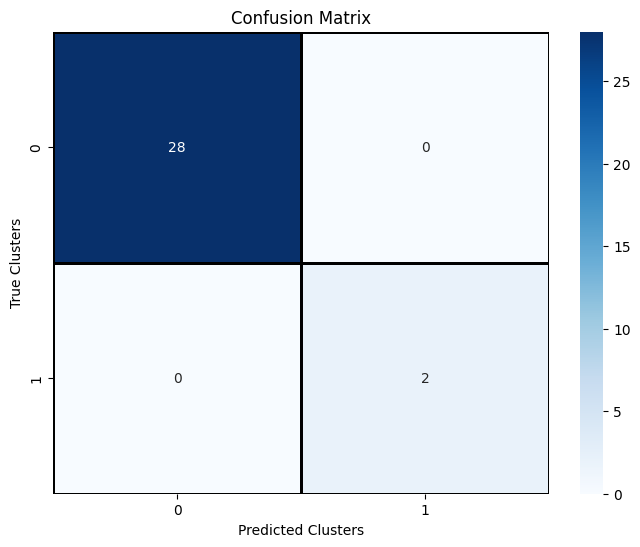

In [20]:
# Plot the confusion matrix using Seaborn heatmap
plt.figure(figsize=(8, 6))  # Set the figure size

# Create a heatmap with annotations and clearly visible gridlines
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', linecolor='black', linewidths=1)

# Add labels and title
plt.title('Confusion Matrix')
plt.xlabel('Predicted Clusters')
plt.ylabel('True Clusters')

# Show the plot
plt.show()


In [21]:
from sklearn.neighbors import KNeighborsClassifier
import random
import numpy as np

# Step 1: Prepare the feature data (already done)
# Assuming 'features' contains the 25 features for each training image
# 'cluster_labels' are the cluster labels obtained from Mean-Shift
# 'test_features' contains features of the test images, and 'true_clusters' are the true labels

# Step 2: Initialize the KNN model
k = 600  # You can adjust the number of neighbors (k) based on your preference
knn = KNeighborsClassifier(n_neighbors=k)

# Step 3: Train the KNN model on the training data
knn.fit(features, cluster_labels)

# Step 4: Predict the clusters for the test data
predicted_clusters = knn.predict(test_features)

# Step 5: Calculate accuracy by comparing predicted clusters to true clusters
correct_predictions = np.sum(true_clusters == predicted_clusters)
accuracy = correct_predictions / n_test_samples * 100

print(f"KNN Accuracy: {accuracy:.2f}%")


KNN Accuracy: 96.67%


In [22]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, classification_report
import numpy as np

# Step 1: Predict the clusters using KNN (already done)
# predicted_clusters = knn.predict(test_features)

# Step 2: Calculate Accuracy
accuracy = accuracy_score(true_clusters, predicted_clusters)
print(f"Accuracy: {accuracy:.2f}")

# Step 3: Calculate Precision, Recall, and F1 Score
precision = precision_score(true_clusters, predicted_clusters, average='macro')
recall = recall_score(true_clusters, predicted_clusters, average='macro')
f1 = f1_score(true_clusters, predicted_clusters, average='macro')

print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1 Score: {f1:.2f}")

# Step 4: Calculate AUC-ROC (only applicable for binary classification)
# If this is a binary classification problem, use this step; otherwise, skip
# AUC-ROC is only applicable for binary classification
# auc_roc = roc_auc_score(true_clusters, predicted_clusters)
# print(f"AUC-ROC: {auc_roc:.2f}")

# Step 5: Generate Confusion Matrix
conf_matrix = confusion_matrix(true_clusters, predicted_clusters)
print("Confusion Matrix:")
print(conf_matrix)

# Step 6: (Optional) Detailed Classification Report
# This will show Precision, Recall, and F1 score for each class
print("\nClassification Report:")
print(classification_report(true_clusters, predicted_clusters))


Accuracy: 0.97
Precision: 0.98
Recall: 0.75
F1 Score: 0.82
Confusion Matrix:
[[28  0]
 [ 1  1]]

Classification Report:
              precision    recall  f1-score   support

           0       0.97      1.00      0.98        28
           1       1.00      0.50      0.67         2

    accuracy                           0.97        30
   macro avg       0.98      0.75      0.82        30
weighted avg       0.97      0.97      0.96        30



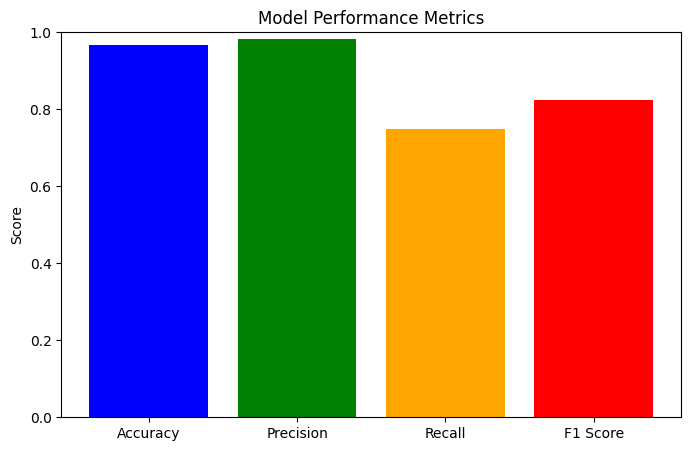

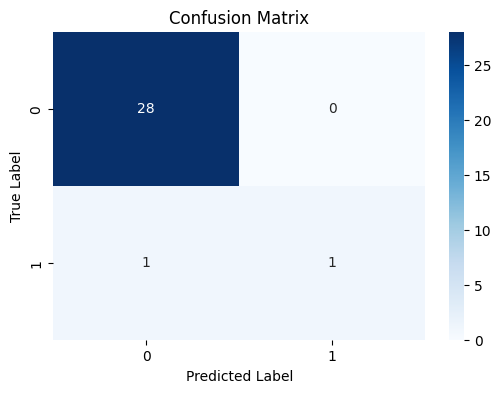

In [23]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import roc_curve, auc

# Step 1: Bar Plot for Accuracy, Precision, Recall, F1 Score
def plot_metrics(accuracy, precision, recall, f1):
    metrics = [accuracy, precision, recall, f1]
    labels = ['Accuracy', 'Precision', 'Recall', 'F1 Score']

    plt.figure(figsize=(8, 5))
    plt.bar(labels, metrics, color=['blue', 'green', 'orange', 'red'])
    plt.ylim(0, 1)  # Values between 0 and 1
    plt.title('Model Performance Metrics')
    plt.ylabel('Score')
    plt.show()

# Call the function with your calculated values
plot_metrics(accuracy, precision, recall, f1)

# Step 2: Heatmap for Confusion Matrix
def plot_confusion_matrix(conf_matrix):
    plt.figure(figsize=(6, 4))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
    plt.title('Confusion Matrix')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()

# Call the function with the confusion matrix
plot_confusion_matrix(conf_matrix)

# Step 3: ROC Curve (For Binary Classification Only)
def plot_roc_curve(true_labels, predicted_probs):
    fpr, tpr, thresholds = roc_curve(true_labels, predicted_probs)
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')  # Diagonal line
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend(loc="lower right")
    plt.show()

# Example usage:
# plot_roc_curve(true_clusters, predicted_clusters)  # Use probabilities, not labels


In [24]:
import numpy as np
import pandas as pd
import random
from sklearn.cluster import KMeans

# Step 1: Load the feature dataset
input_file = '/content/extracted_features_with_clusters.csv'
data = pd.read_csv(input_file)

# Prepare features (assuming the first column is the image name and the last column is 'Cluster')
features = data.iloc[:, 1:-1].values  # All rows, but only feature columns
true_clusters = data['Cluster'].values  # True cluster labels for training data

# Step 2: Specify the number of clusters (k)
k = 4  # Choose the number of clusters

# Step 3: Fit the K-Means model
kmeans = KMeans(n_clusters=k, random_state=42)
kmeans.fit(features)

# Step 4: Randomly select test samples
n_test_samples = 30
random_indices = random.sample(range(len(features)), n_test_samples)

# Extract the test features and their corresponding true cluster labels
test_features = features[random_indices]
true_clusters_for_test = true_clusters[random_indices]  # True clusters for selected test samples

# Step 5: Predict cluster labels for the test images
predicted_clusters = kmeans.predict(test_features)

# Step 6: Calculate accuracy by comparing predicted clusters to true clusters
correct_predictions = np.sum(true_clusters_for_test == predicted_clusters)
accuracy = correct_predictions / n_test_samples * 100

print(f"K-Means Accuracy: {accuracy:.2f}%")


K-Means Accuracy: 80.00%


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


K-Means Accuracy: 80.00%
Precision: 1.00
Recall: 0.80
F1 Score: 0.89


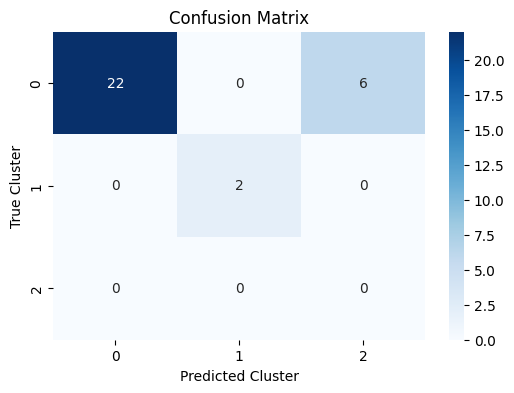

In [25]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, roc_auc_score
import matplotlib.pyplot as plt
import seaborn as sns

# Step 7: Calculate Accuracy, Precision, Recall, F1 Score
accuracy = accuracy_score(true_clusters_for_test, predicted_clusters)
precision = precision_score(true_clusters_for_test, predicted_clusters, average='weighted')
recall = recall_score(true_clusters_for_test, predicted_clusters, average='weighted')
f1 = f1_score(true_clusters_for_test, predicted_clusters, average='weighted')

print(f"K-Means Accuracy: {accuracy * 100:.2f}%")
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1 Score: {f1:.2f}")

# Step 8: Confusion Matrix
conf_matrix = confusion_matrix(true_clusters_for_test, predicted_clusters)

# Plot Confusion Matrix
plt.figure(figsize=(6,4))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Cluster")
plt.ylabel("True Cluster")
plt.show()

# Optional: If you have probabilities (for AUC-ROC)
# predicted_probs = kmeans.transform(test_features)
# auc_roc = roc_auc_score(true_clusters_for_test, predicted_probs, multi_class='ovo', average='weighted')
# print(f"AUC-ROC Score: {auc_roc:.2f}")


In [26]:
import numpy as np
import pandas as pd
import random

# Load your feature dataset (make sure it has been prepared correctly)
input_file = '/content/extracted_features_with_clusters.csv'
data = pd.read_csv(input_file)

# Prepare features and true cluster labels
features = data.iloc[:, 1:-1].values  # All rows, but only feature columns
true_clusters = data['Cluster'].values  # True cluster labels for training data

# Step 1: Calculate mean feature vectors for each cluster
unique_clusters = np.unique(true_clusters)
mean_vectors = {}
for cluster in unique_clusters:
    mean_vectors[cluster] = np.mean(features[true_clusters == cluster], axis=0)

# Step 2: Randomly select test samples
n_test_samples = 50
random_indices = random.sample(range(len(features)), n_test_samples)

# Extract the test features and their corresponding true cluster labels
test_features = features[random_indices]
true_clusters_for_test = true_clusters[random_indices]  # True clusters for selected test samples

# Step 3: Classify test samples using the Minimum Distance Classifier
predicted_clusters = []
for test_vector in test_features:
    # Calculate distances to each cluster mean
    distances = {cluster: np.linalg.norm(test_vector - mean) for cluster, mean in mean_vectors.items()}
    # Assign the cluster with the minimum distance
    predicted_cluster = min(distances, key=distances.get)
    predicted_clusters.append(predicted_cluster)

predicted_clusters = np.array(predicted_clusters)

# Step 4: Calculate accuracy by comparing predicted clusters to true clusters
correct_predictions = np.sum(true_clusters_for_test == predicted_clusters)
accuracy = correct_predictions / n_test_samples * 100

print(f"Minimum Distance Classifier Accuracy: {accuracy:.2f}%")


Minimum Distance Classifier Accuracy: 96.00%


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Accuracy: 98.00%
Precision: 1.00
Recall: 0.98
F1 Score: 0.99


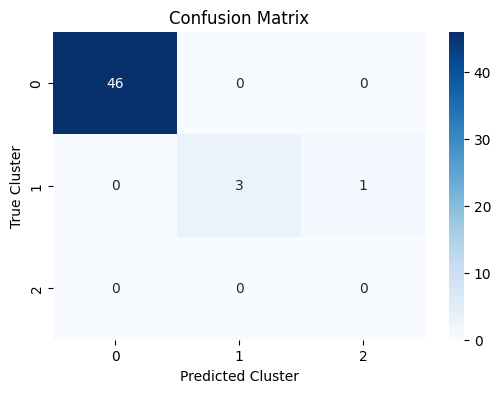

In [28]:
import numpy as np
import pandas as pd
import random
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import seaborn as sns

# Load your feature dataset (make sure it has been prepared correctly)
input_file = '/content/extracted_features_with_clusters.csv'
data = pd.read_csv(input_file)

# Prepare features and true cluster labels
features = data.iloc[:, 1:-1].values  # All rows, but only feature columns
true_clusters = data['Cluster'].values  # True cluster labels for training data

# Step 1: Calculate mean feature vectors for each cluster
unique_clusters = np.unique(true_clusters)
mean_vectors = {}
for cluster in unique_clusters:
    mean_vectors[cluster] = np.mean(features[true_clusters == cluster], axis=0)

# Step 2: Randomly select test samples
n_test_samples = 50
random_indices = random.sample(range(len(features)), n_test_samples)

# Extract the test features and their corresponding true cluster labels
test_features = features[random_indices]
true_clusters_for_test = true_clusters[random_indices]  # True clusters for selected test samples

# Step 3: Classify test samples using the Minimum Distance Classifier
predicted_clusters = []
for test_vector in test_features:
    # Calculate distances to each cluster mean
    distances = {cluster: np.linalg.norm(test_vector - mean) for cluster, mean in mean_vectors.items()}
    # Assign the cluster with the minimum distance
    predicted_cluster = min(distances, key=distances.get)
    predicted_clusters.append(predicted_cluster)

predicted_clusters = np.array(predicted_clusters)

# Step 4: Calculate accuracy by comparing predicted clusters to true clusters
accuracy = accuracy_score(true_clusters_for_test, predicted_clusters)
precision = precision_score(true_clusters_for_test, predicted_clusters, average='weighted')
recall = recall_score(true_clusters_for_test, predicted_clusters, average='weighted')
f1 = f1_score(true_clusters_for_test, predicted_clusters, average='weighted')

# Step 5: Confusion Matrix
conf_matrix = confusion_matrix(true_clusters_for_test, predicted_clusters)

# Step 6: Calculate AUC-ROC Score (Binarize the labels for multi-class ROC-AUC calculation)
true_clusters_binarized = label_binarize(true_clusters_for_test, classes=unique_clusters)
predicted_clusters_binarized = label_binarize(predicted_clusters, classes=unique_clusters)

# Print the results
print(f"Accuracy: {accuracy * 100:.2f}%")
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1 Score: {f1:.2f}")

# Step 7: Plot Confusion Matrix
plt.figure(figsize=(6,4))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Cluster")
plt.ylabel("True Cluster")
plt.show()
